<a href="https://colab.research.google.com/github/jennychen0223/YOLO_mask_object_detection/blob/main/Mask_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#複製darknet
! git clone https://github.com/pjreddie/darknet.git

Cloning into 'darknet'...
remote: Enumerating objects: 5937, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 5937 (delta 0), reused 1 (delta 0), pack-reused 5934
Receiving objects: 100% (5937/5937), 6.35 MiB | 28.26 MiB/s, done.
Resolving deltas: 100% (3926/3926), done.


In [ ]:
#修改MakeFile
!sed -i "s/GPU=0/GPU=1/g" darknet/Makefile
!sed -i "s/CUDNN=0/CUDNN=1/g" darknet/Makefile
!sed -i "s/OPENCV=0/OPENCV=1/g" darknet/Makefile

In [ ]:
#編譯YOLO
! cd darknet; make

gcc -Iinclude/ -Isrc/ -DOPENCV `pkg-config --cflags opencv`  -DGPU -I/usr/local/cuda/include/ -DCUDNN  -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -c ./src/gemm.c -o obj/gemm.o
./src/gemm.c: In function ‘time_gpu’:
./src/gemm.c:232:9: warning: ‘cudaThreadSynchronize’ is deprecated [-Wdeprecated-declarations]
         cudaThreadSynchronize();
         ^~~~~~~~~~~~~~~~~~~~~
In file included from /usr/local/cuda/include/cuda_runtime.h:96:0,
                 from include/darknet.h:11,
                 from ./src/utils.h:5,
                 from ./src/gemm.c:2:
/usr/local/cuda/include/cuda_runtime_api.h:967:57: note: declared here
 extern __CUDA_DEPRECATED __host__ cudaError_t CUDARTAPI cudaThreadSynchronize(void);
                                                         ^~~~~~~~~~~~~~~~~~~~~
gcc -Iinclude/ -Isrc/ -DOPENCV `pkg-config --cflags opencv`  -DGPU -I/usr/local/cuda/include/ -DCUDNN  -Wall -Wno-unused-result -Wno-unknown-pragmas

# **檢視訓練資料集**

In [ ]:
#colab連接到GOOGLE Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#從Google Drive下載資料
! cp "/content/drive/My Drive/AIDataset/medical-masks-dataset.zip" /content/

In [ ]:
#資料解壓縮
! unzip /content/medical-masks-dataset.zip > data_unzip.log

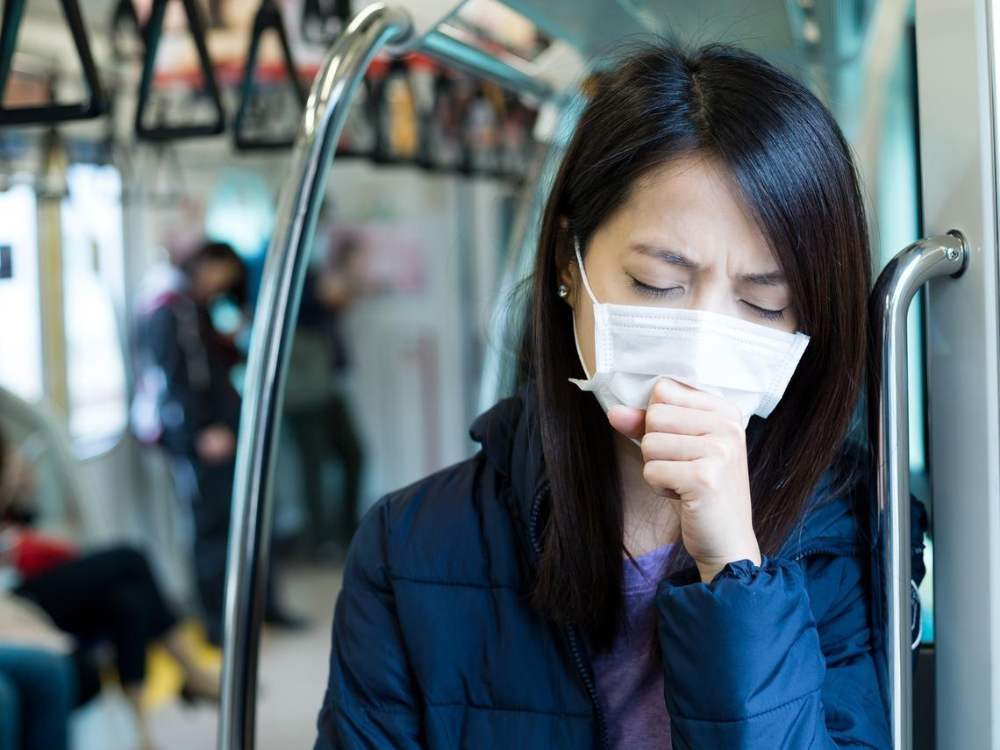

In [ ]:
#查看照片
from PIL import Image
img = Image.open('/content/images/012106.jpg_1140x855.jpg')
img

In [ ]:
#查看圖片對應的XML
! cat /content/labels/012106.jpg_1140x855.xml

<annotation>
	<folder>images</folder>
	<filename>012106.jpg_1140x855.jpg</filename>
	<path>P:\mask_mouth\images\012106.jpg_1140x855.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>1140</width>
		<height>855</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>good</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>654</xmin>
			<ymin>275</ymin>
			<xmax>910</xmax>
			<ymax>517</ymax>
		</bndbox>
	</object>
</annotation>


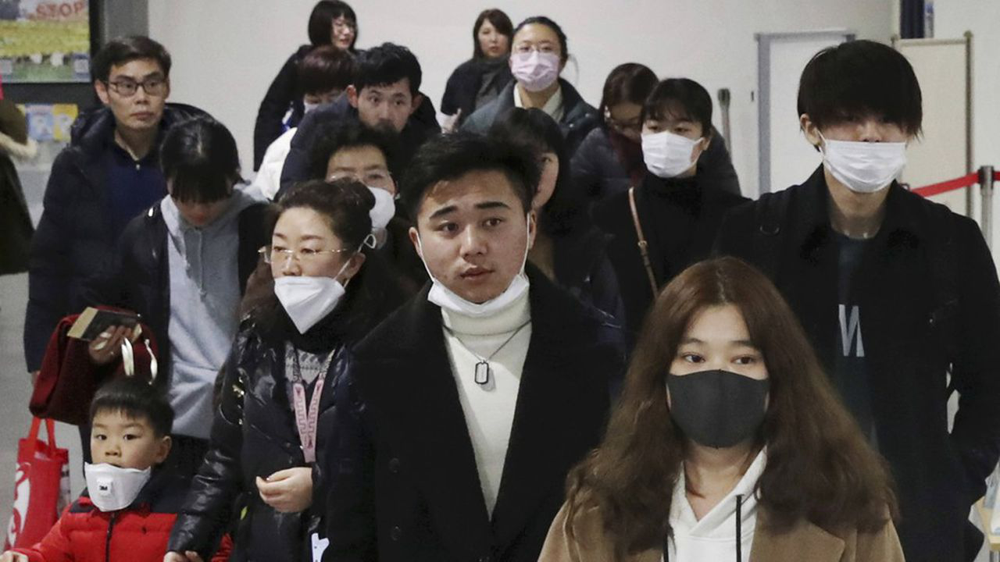

In [ ]:
#查看照片
from PIL import Image
img = Image.open('/content/images/0602623232127-web-tete.jpg')
img

In [ ]:
#查看圖片對應的XML
! cat /content/labels/0602623232127-web-tete.xml

<annotation>
	<folder>images</folder>
	<filename>0602623232127-web-tete.jpg</filename>
	<path>P:\mask_mouth\images\0602623232127-web-tete.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>1280</width>
		<height>720</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>bad</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>134</xmin>
			<ymin>84</ymin>
			<xmax>220</xmax>
			<ymax>166</ymax>
		</bndbox>
	</object>
	<object>
		<name>bad</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>420</xmin>
			<ymin>16</ymin>
			<xmax>460</xmax>
			<ymax>63</ymax>
		</bndbox>
	</object>
	<object>
		<name>bad</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>610</xmin>
			<ymin>26</ymin>
			<xmax>656</xmax>
			<ymax>77</ymax>
		</bndbox>
	</object>
	<object>
		<name>good</n

In [ ]:
#建立YOLO資料夾
! rm -rf /content/yolo
! mkdir /content/yolo

In [ ]:
from bs4 import BeautifulSoup
import os
import shutil

#建置一個status_dic
status_dic = {'good': 2, 'bad': 1, 'none': 0}

def getYoloFormat(filename,label_path, img_path, yolo_path, newname):
    with open(label_path+ filename, 'r') as f:
        #讀取xml
        soup = BeautifulSoup(f.read(), 'xml')
        imgname = soup.select_one('filename').text
        image_w = int(soup.select_one('width').text)
        image_h = int(soup.select_one('height').text)
        ary = []
        
        for obj in soup.select('object'):
            #取出xmin, xmax, ymin, ymax，並用status_dic轉換
            xmin = int(obj.select_one('xmin').text)
            xmax = int(obj.select_one('xmax').text)
            ymin = int(obj.select_one('ymin').text)
            ymax = int(obj.select_one('ymax').text)
            objclass = status_dic.get(obj.select_one('name').text)

            #轉成YOLO格式
            x = (xmin + (xmax-xmin)/2) * 1.0 / image_w
            y = (ymin + (ymax-ymin)/2) * 1.0 / image_h
            w = (xmax-xmin) * 1.0 / image_w
            h = (ymax-ymin) * 1.0 / image_h
            ary.append(' '.join([str(objclass), str(x), str(y), str(w), str(h)]))
           
        if os.path.exists(img_path + imgname):
            #把圖片移到yolo之下，同時把參數寫到yolo之下
            shutil.copyfile(img_path + imgname, yolo_path + newname + '.jpg')
            with open(yolo_path + newname + '.txt', 'w') as f:
              f.write('\n'.join(ary))

In [ ]:
import os
#設定路徑
labelpath = '/content/labels/'
imgpath = '/content/images/'
yolopath = '/content/yolo/'
ary = []

for idx, f in enumerate(os.listdir(labelpath)):
    try:
        #透過getYoloFromat將圖像爛參數檔寫到YOLO下
        getYoloFormat(f, labelpath, imgpath, yolopath, str(idx))
    except Exception as e:
        print(e)

float division by zero


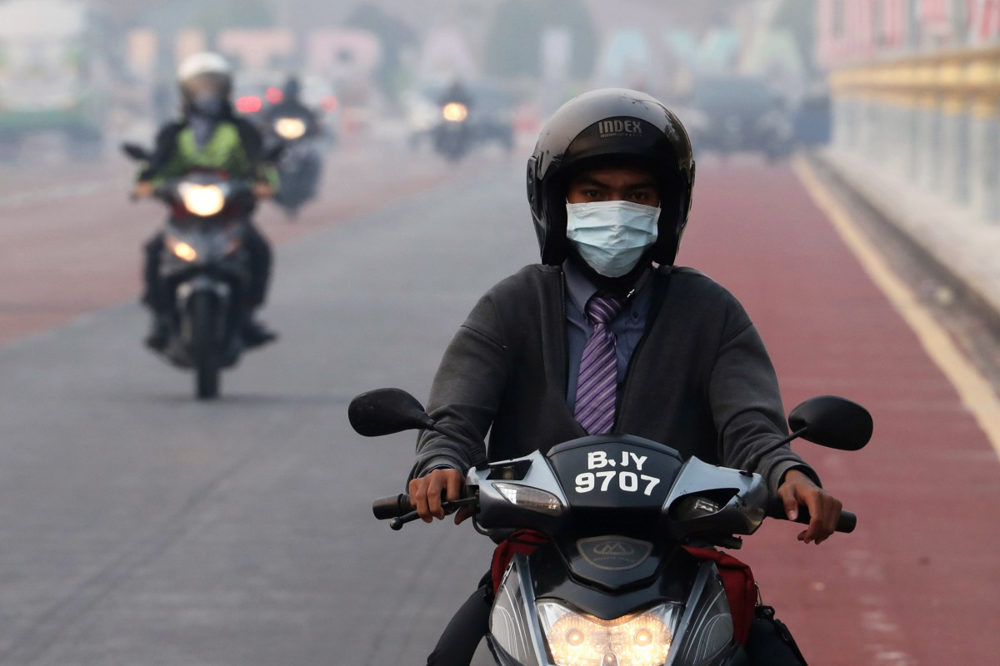

In [ ]:
from PIL import Image
Image.open('/content/yolo/10.jpg')

In [ ]:
#觀察對應的標記檔
! cat /content/yolo/0.txt

1 0.27734375 0.08125 0.04114583333333333 0.09416666666666666
2 0.5182291666666666 0.10083333333333333 0.04895833333333333 0.08333333333333333
2 0.5833333333333334 0.3933333333333333 0.04791666666666667 0.08
2 0.70625 0.17583333333333334 0.053125 0.08833333333333333

# **準備訓練與測試資料集**

In [ ]:
#建立cfg_mask資料夾
! rm -rf /content/cfg_mask
! mkdir /content/cfg_mask

In [ ]:
#/content/yolo/中從取出前80%的資料
import os
datasets = ['/content/yolo/' + f for f in os.listdir('/content/yolo/') if not f.endswith('.txt')]
len(datasets) * 0.8

541.6

In [ ]:
with open('/content/cfg_mask/train.txt', 'w') as f:
    #打開前80%的資料寫入train.txt
    f.write('\n'.join(datasets[0:540]))

In [ ]:
with open('/content/cfg_mask/test.txt', 'w') as f:
    #打開後20%的資料寫入test.txt
    f.write('\n'.join(datasets[540:0]))

# **複製參數檔案**

In [ ]:
! cp "/content/drive/My Drive/AIDataset/obj.data" cfg_mask/
! cp "/content/drive/My Drive/AIDataset/obj.names" cfg_mask/

In [ ]:
! head /content/cfg_mask/obj.data

classes= 3
train  = /content/cfg_mask/train.txt
valid  = /content/cfg_mask/test.txt
names  = /content/cfg_mask/obj.names
backup = /content/cfg_mask/weights/

In [ ]:
! head /content/cfg_mask/train.txt

/content/yolo/115.jpg
/content/yolo/502.jpg
/content/yolo/690.jpg
/content/yolo/568.jpg
/content/yolo/40.jpg
/content/yolo/521.jpg
/content/yolo/203.jpg
/content/yolo/410.jpg
/content/yolo/400.jpg
/content/yolo/230.jpg


In [ ]:
! head /content/cfg_mask/obj.names

none
bad
good


# **建立權重資料夾**

In [ ]:
#建立權重資料夾
! mkdir /content/cfg_mask/weights

# **YOLO v3 架構**

%%html
<img src='https://miro.medium.com/max/2000/1*d4Eg17IVJ0L41e7CTWLLSg.png' width="800px" />

%%html
<img src='https://miro.medium.com/max/1200/0*3A8U0Hm5IKmRa6hu.png' width="500px" />

修改 yolov3-tiny.cfg
*   YOLOV3 偵測的濾鏡(filter) 大小為 (C+5)*B.
*   B 是每個Feature Map 可以偵測的Bounding Box 數量  =>縮放三個尺寸，所以B=3
*   5 是Bounding Box 的x,y,w,h 以及 Confidence
*   C 是類別數量
*   filters=(classes + 5)*3 # 24
*   classes=3





In [ ]:
! cp /content/darknet/cfg/yolov3-tiny.cfg /content/cfg_mask/

In [ ]:
! sed -n -e 127p -e 135p -e 171p -e 177p /content/cfg_mask/yolov3-tiny.cfg

filters=255
classes=80
filters=255
classes=80


In [ ]:
#修改參數
! sed -i '127s/255/24/' /content/cfg_mask/yolov3-tiny.cfg
! sed -i '135s/80/3/' /content/cfg_mask/yolov3-tiny.cfg
! sed -i '171s/255/24/' /content/cfg_mask/yolov3-tiny.cfg
! sed -i '177s/80/3/' /content/cfg_mask/yolov3-tiny.cfg

In [ ]:
! sed -n -e 127p -e 135p -e 171p -e 177p /content/cfg_mask/yolov3-tiny.cfg

filters=24
classes=3
filters=24
classes=3


# **開始訓練模型**
複製權重
*   darknet53: 利用Imagenet 訓練出來的 53 層預訓練模型

In [ ]:
#!wget https://pjreddie.com/media/files/darknet53.conv.74
! cp "/content/drive/My Drive/AIDataset/darknet53.conv.74" /content/cfg_mask/

# **訓練模型**

In [ ]:
#訓練模型
! darknet/darknet detector train /content/cfg_mask/obj.data /content/cfg_mask/yolov3-tiny.cfg /content/cfg_mask/darknet53.conv.74

串流輸出內容已截斷至最後 5000 行。
32373: 1.138609, 5.216839 avg, 0.001000 rate, 0.008337 seconds, 32373 images
Loaded: 0.013889 seconds
Region 16 Avg IOU: 0.792602, Class: 0.997876, Obj: 0.335157, No Obj: 0.002654, .5R: 1.000000, .75R: 1.000000,  count: 1
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000034, .5R: -nan, .75R: -nan,  count: 0
32374: 0.342681, 4.729424 avg, 0.001000 rate, 0.007656 seconds, 32374 images
Loaded: 0.025149 seconds
Region 16 Avg IOU: 0.892094, Class: 0.996697, Obj: 0.693602, No Obj: 0.004205, .5R: 1.000000, .75R: 1.000000,  count: 2
Region 23 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000097, .5R: -nan, .75R: -nan,  count: 0
32375: 0.240231, 4.280504 avg, 0.001000 rate, 0.008383 seconds, 32375 images
Loaded: 0.011744 seconds
Region 16 Avg IOU: -nan, Class: -nan, Obj: -nan, No Obj: 0.000041, .5R: -nan, .75R: -nan,  count: 0
Region 23 Avg IOU: 0.778290, Class: 0.971588, Obj: 0.875229, No Obj: 0.002352, .5R: 1.000000, .75R: 0.750000,  count: 4
32376: 0.7141

# **辨識圖片中的人物是否有戴口罩**

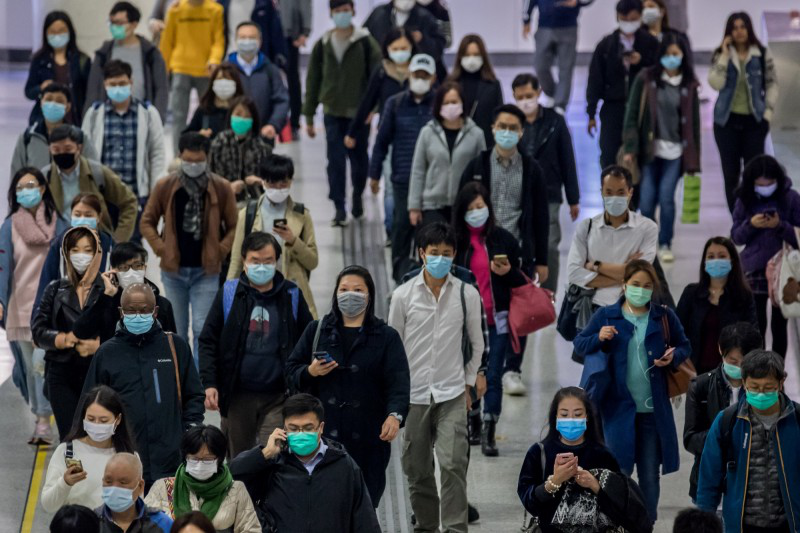

In [ ]:
from PIL import Image
Image.open('yolo/605.jpg')

In [ ]:
#辨識圖片中的人物是否有戴口罩
! cp "/content/drive/MyDrive/AIDataset/yolov3-tiny_80000.weights" /content/cfg_mask/weights

In [ ]:
! cd darknet; ./darknet detector test /content/cfg_mask/obj.data /content/cfg_mask/yolov3-tiny.cfg /content/cfg_mask/weights/yolov3-tiny_80000.weights /content/yolo/605.jpg


layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16  0.150 BFLOPs
    1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16
    2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32  0.399 BFLOPs
    3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32
    4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64  0.399 BFLOPs
    5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64
    6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128  0.399 BFLOPs
    7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128
    8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256  0.399 BFLOPs
    9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256
   10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512  0.399 BFLOPs
   11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512
   12 con

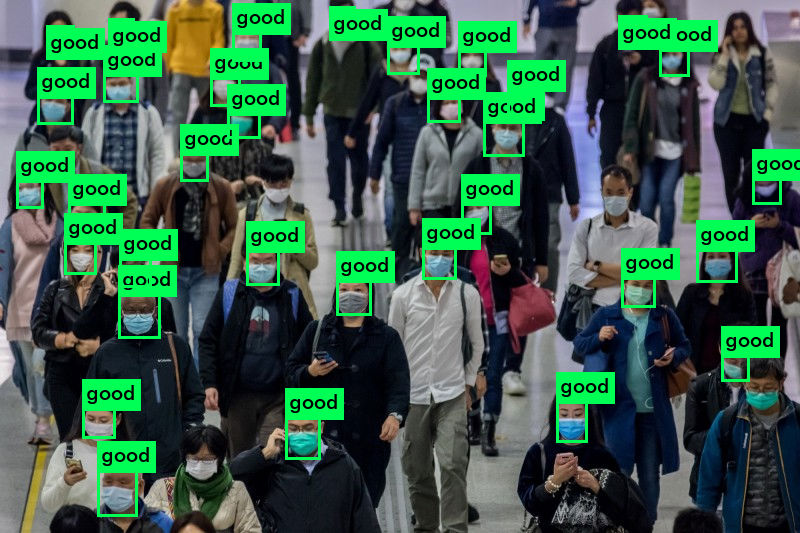

In [ ]:
from PIL import Image
Image.open('/content/darknet/predictions.jpg')

In [ ]:
! cp "/content/drive/My Drive/AIDataset/test.jpg" /content/

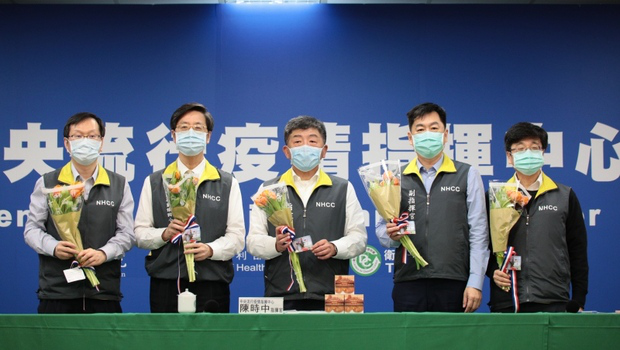

In [ ]:
from PIL import Image
Image.open('/content/test.jpg')

In [ ]:
#辨識陳時中的是否有戴口罩
! cd darknet; ./darknet detector test /content/cfg_mask/obj.data /content/cfg_mask/yolov3-tiny.cfg /content/cfg_mask/weights/yolov3-tiny_80000.weights /content/test.jpg

layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16  0.150 BFLOPs
    1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16
    2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32  0.399 BFLOPs
    3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32
    4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64  0.399 BFLOPs
    5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64
    6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128  0.399 BFLOPs
    7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128
    8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256  0.399 BFLOPs
    9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256
   10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512  0.399 BFLOPs
   11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512
   12 con

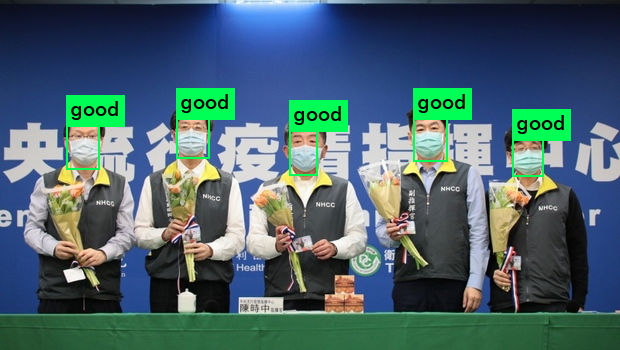

In [ ]:
from PIL import Image
Image.open('/content/darknet/predictions.jpg')

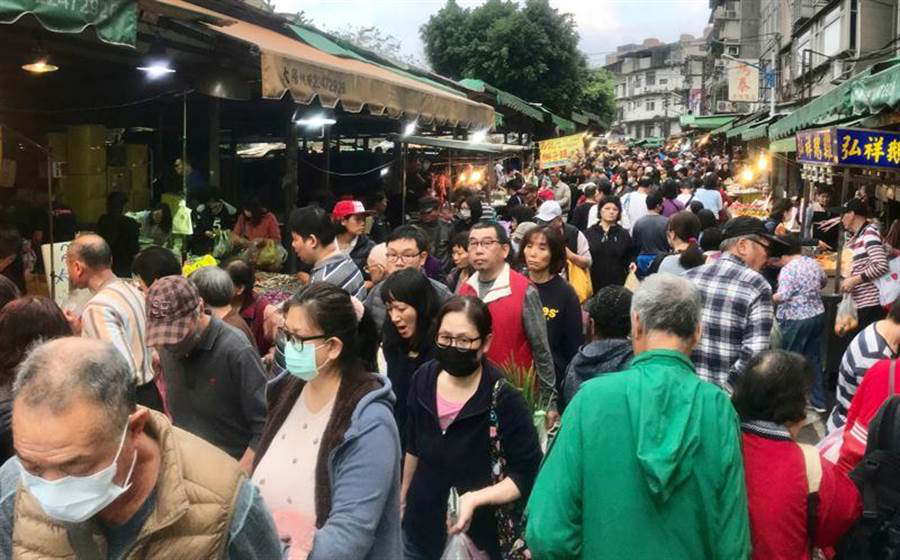

In [ ]:
! cp "/content/drive/My Drive/AIDataset/test2.jpg" /content/
Image.open('/content/test2.jpg')

In [ ]:
! cd darknet; ./darknet detector test /content/cfg_mask/obj.data /content/cfg_mask/yolov3-tiny.cfg /content/cfg_mask/weights/yolov3-tiny_80000.weights /content/test2.jpg

layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16  0.150 BFLOPs
    1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16
    2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32  0.399 BFLOPs
    3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32
    4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64  0.399 BFLOPs
    5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64
    6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128  0.399 BFLOPs
    7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128
    8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256  0.399 BFLOPs
    9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256
   10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512  0.399 BFLOPs
   11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512
   12 con

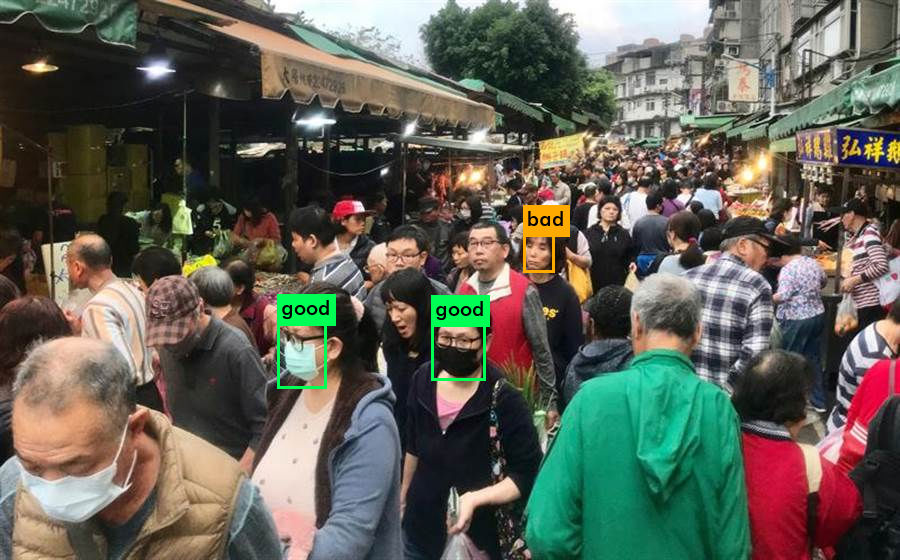

In [ ]:
Image.open('/content/darknet/predictions.jpg')

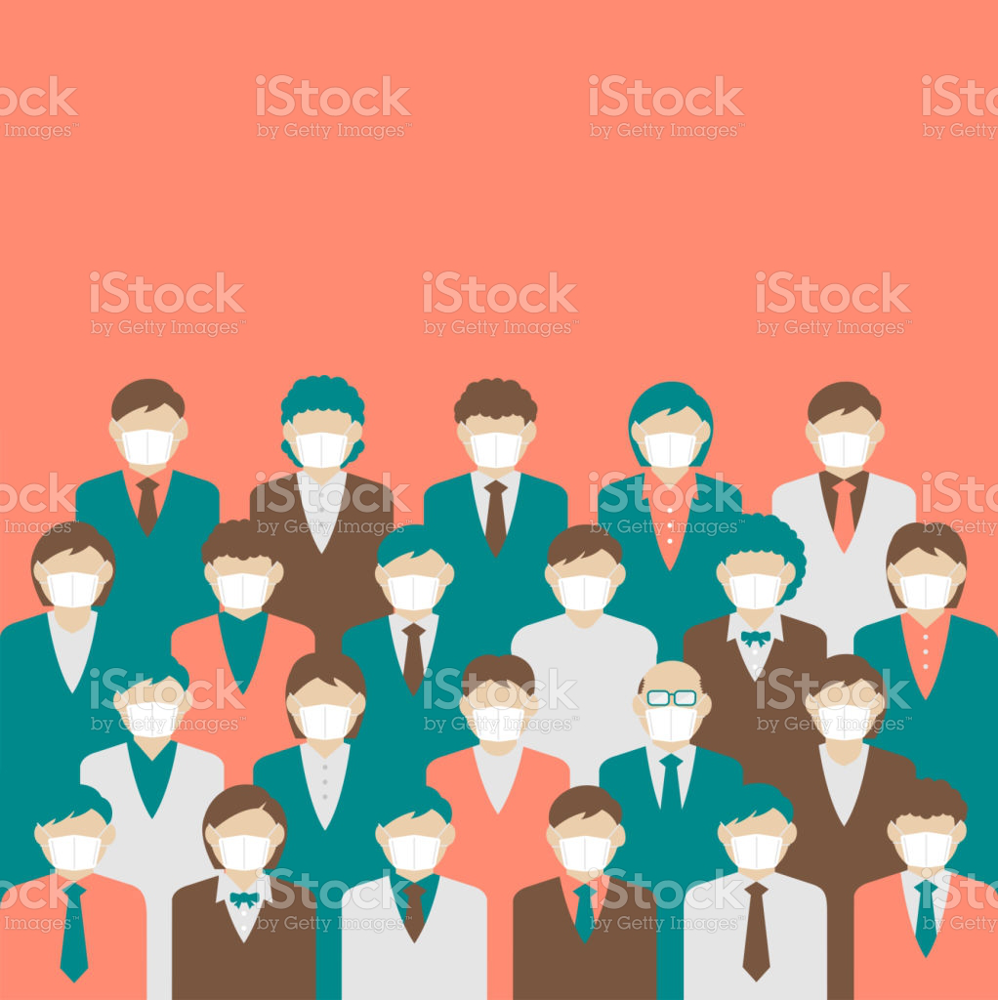

In [ ]:
! cp "/content/drive/My Drive/AIDataset/test3.jpg" /content/
Image.open('/content/test3.jpg')

In [ ]:
! cd darknet; ./darknet detector test /content/cfg_mask/obj.data /content/cfg_mask/yolov3-tiny.cfg /content/cfg_mask/weights/yolov3-tiny_80000.weights /content/test3.jpg

layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16  0.150 BFLOPs
    1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16
    2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32  0.399 BFLOPs
    3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32
    4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64  0.399 BFLOPs
    5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64
    6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128  0.399 BFLOPs
    7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128
    8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256  0.399 BFLOPs
    9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256
   10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512  0.399 BFLOPs
   11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512
   12 con

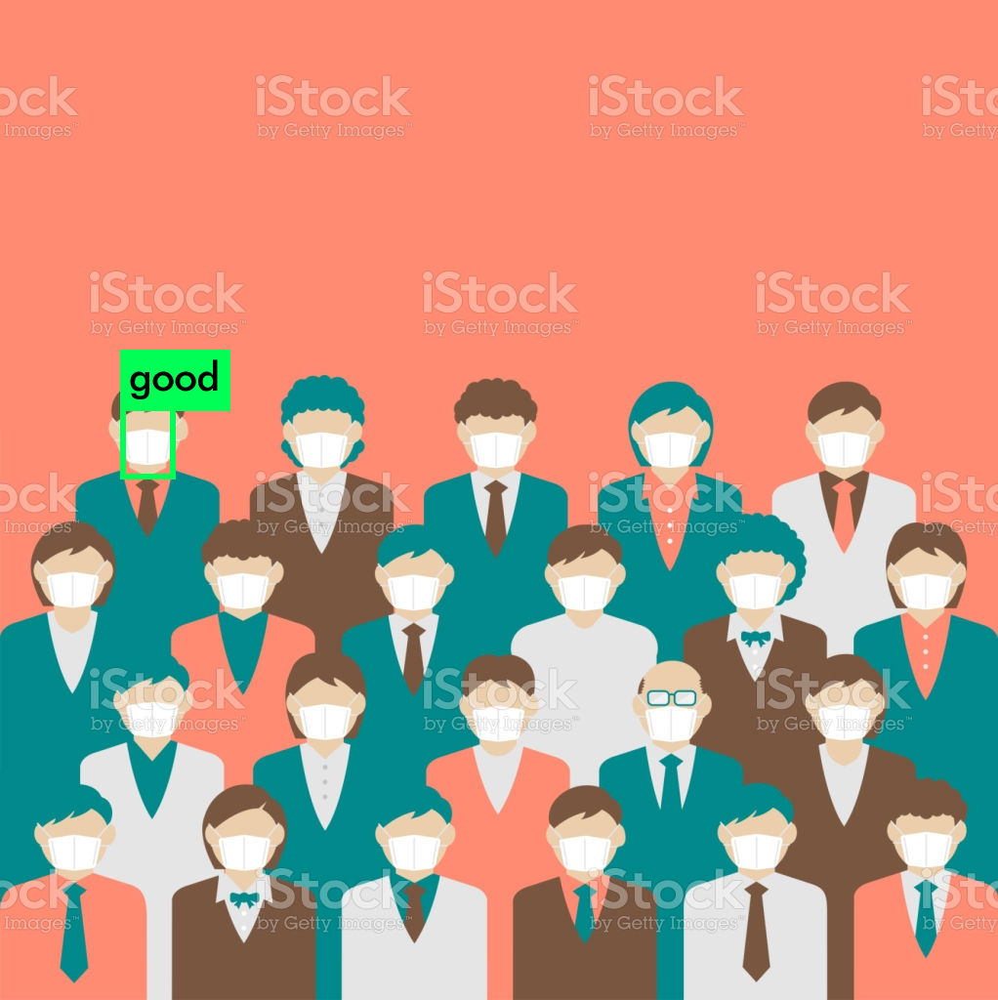

In [ ]:
Image.open('/content/darknet/predictions.jpg')

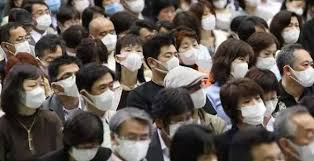

In [ ]:
! cp "/content/drive/My Drive/AIDataset/test4.jpg" /content/
Image.open('/content/test4.jpg')

In [ ]:
! cd darknet; ./darknet detector test /content/cfg_mask/obj.data /content/cfg_mask/yolov3-tiny.cfg /content/cfg_mask/weights/yolov3-tiny_80000.weights /content/test4.jpg

layer     filters    size              input                output
    0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16  0.150 BFLOPs
    1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16
    2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32  0.399 BFLOPs
    3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32
    4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64  0.399 BFLOPs
    5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64
    6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128  0.399 BFLOPs
    7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128
    8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256  0.399 BFLOPs
    9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256
   10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512  0.399 BFLOPs
   11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512
   12 con

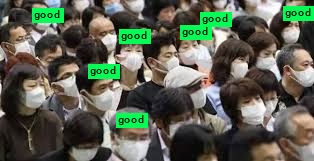

In [ ]:
Image.open('/content/darknet/predictions.jpg')